In [1]:
#  Implementing a predictive model on Rain Dataset to predict whether or not it will rain tomorrow in Australia

#  Dataset contains about 10 years of daily weather observations of different locations in Australia.

#  Problem Statement: Design a predictive model with the use of machine learning algorithms 
#                       to forecast whether or not it will rain tomorrow in Australia.

#  Data Source: https://www.kaggle.com/jsphyg/weather-dataset-rattle-package:

#   Dataset Description:
#    Number of columns: 23
#    Number of rows: 145460
#    Number of Independent Columns: 22
#    Number of Dependent Column: 1

In [2]:
# Contents:
#  Data Preprocessing
#  Finding categorical and Numerical features in Dataset
#  Cardinality check for categorical features
#  Handling Missing values
#  Outlier detection and treatment
#  Exploratory Data Analysis
#  Encoding categorical features
#  Correlation
#  Feature Importance
#  Splitting Data into Training and Testing sets
#  Feature Scaling
#  Model Building and Evaluation
#  Results and Conclusion
#  Save Model and Scaling object with Pickle

In [3]:
#  Importing Necessary Libraries

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

# Loading the Dataset

dataset = 'weatherAUS.csv'
rain = pd.read_csv(dataset)

# Checking the Column Names 

print (rain.head())

         Date Location  MinTemp  MaxTemp  Rainfall  Evaporation  Sunshine  \
0  2008-12-01   Albury     13.4     22.9       0.6          NaN       NaN   
1  2008-12-02   Albury      7.4     25.1       0.0          NaN       NaN   
2  2008-12-03   Albury     12.9     25.7       0.0          NaN       NaN   
3  2008-12-04   Albury      9.2     28.0       0.0          NaN       NaN   
4  2008-12-05   Albury     17.5     32.3       1.0          NaN       NaN   

  WindGustDir  WindGustSpeed WindDir9am  ... Humidity9am  Humidity3pm  \
0           W           44.0          W  ...        71.0         22.0   
1         WNW           44.0        NNW  ...        44.0         25.0   
2         WSW           46.0          W  ...        38.0         30.0   
3          NE           24.0         SE  ...        45.0         16.0   
4           W           41.0        ENE  ...        82.0         33.0   

   Pressure9am  Pressure3pm  Cloud9am  Cloud3pm  Temp9am  Temp3pm  RainToday  \
0       1007.7    

In [4]:
# Checking the Dimension of the Dataset:
#  As we can see from the results that the dataset has 23 variables and 145460 records

print(rain.shape)

(145460, 23)


In [5]:
# Data Preprocessing: 


# Real-world data is often messy, incomplete, unstructured, inconsistent, redundant, sprinkled with wacky values. So, without deploying any Data Preprocessing techniques, it is almost impossible to gain insights from raw data.
# What exactly is Data Preprocessing?

#  Data preprocessing is a process of converting raw data to a suitable format to extract insights. 
#  It is the first and foremost step in the Data Science life cycle. 
#  Data Preprocessing makes sure that data is clean, organize and read-to-feed to the Machine Learning model.

# Consise Summary of the Dataset

print(rain.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145460 entries, 0 to 145459
Data columns (total 23 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Date           145460 non-null  object 
 1   Location       145460 non-null  object 
 2   MinTemp        143975 non-null  float64
 3   MaxTemp        144199 non-null  float64
 4   Rainfall       142199 non-null  float64
 5   Evaporation    82670 non-null   float64
 6   Sunshine       75625 non-null   float64
 7   WindGustDir    135134 non-null  object 
 8   WindGustSpeed  135197 non-null  float64
 9   WindDir9am     134894 non-null  object 
 10  WindDir3pm     141232 non-null  object 
 11  WindSpeed9am   143693 non-null  float64
 12  WindSpeed3pm   142398 non-null  float64
 13  Humidity9am    142806 non-null  float64
 14  Humidity3pm    140953 non-null  float64
 15  Pressure9am    130395 non-null  float64
 16  Pressure3pm    130432 non-null  float64
 17  Cloud9am       89572 non-null

In [6]:
# We can see that except for the Date and The Location columns - every dataset has a missing value 
# We would now be generating "DESCRIPTIVE STATISTICS" of the dataset using the describe () function in pandas 
# The data values that are 'object' will be ommitted through the exclude = object arguement within describe() function

rain.describe(exclude=object).transpose()

,count,mean,std,min,25%,50%,75%,max
MinTemp,143975.0,12.194034,6.398495,-8.5,7.6,12.0,16.9,33.9
MaxTemp,144199.0,23.221348,7.119049,-4.8,17.9,22.6,28.2,48.1
Rainfall,142199.0,2.360918,8.478060,0.0,0.0,0.0,0.8,371.0
Evaporation,82670.0,5.468232,4.193704,0.0,2.6,4.8,7.4,145.0
Sunshine,75625.0,7.611178,3.785483,0.0,4.8,8.4,10.6,14.5
WindGustSpeed,135197.0,40.035230,13.607062,6.0,31.0,39.0,48.0,135.0
WindSpeed9am,143693.0,14.043426,8.915375,0.0,7.0,13.0,19.0,130.0
WindSpeed3pm,142398.0,18.662657,8.809800,0.0,13.0,19.0,24.0,87.0
Humidity9am,142806.0,68.880831,19.029164,0.0,57.0,70.0,83.0,100.0
Humidity3pm,140953.0,51.539116,20.795902,0.0,37.0,52.0,66.0,100.0


In [7]:
rain.describe(include=object).transpose()

,count,unique,top,freq
Date,145460,3436,2016-06-17,49
Location,145460,49,Canberra,3436
WindGustDir,135134,16,W,9915
WindDir9am,134894,16,N,11758
WindDir3pm,141232,16,SE,10838
RainToday,142199,2,No,110319
RainTomorrow,142193,2,No,110316


In [8]:
# Finding Categorical and Numerical Features in the Dataset

# Categorical Features in the Dataset

categorical_features = [column_name for column_name in rain.columns if rain[column_name].dtype == 'O']

print("Number of Categorical Features: {}".format(len(categorical_features))) # Number of Categorical Features

print("Categorical Features:", categorical_features) # Names of Categorical Features

Number of Categorical Features: 7
Categorical Features: ['Date', 'Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday', 'RainTomorrow']


In [9]:
# Numerical Feature in the Dataset

numerical_features = [column_name for column_name in rain.columns if rain[column_name].dtype != 'O']

print("Number of Numerical Features: {}".format(len(numerical_features)))

print("Numerical Features: ",numerical_features)

Number of Numerical Features: 16
Numerical Features:  ['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm']


In [10]:
# Cardinality check for Categorical features:

# The accuracy, performance of a classifier not only depends on the model that we use, 
# but also depends on how we preprocess data, and what kind of data you’re feeding to the classifier to learn.

# Many Machine learning algorithms like Linear Regression, Logistic Regression, k-nearest neighbors, etc. 
# can handle only numerical data, so encoding categorical data to numeric becomes a necessary step.  
# But before jumping into encoding, check the cardinality of each categorical feature.


# Cardinality: The number of unique values in each categorical feature is known as cardinality.


# A feature with a high number of distinct/ unique values is a high cardinality feature. 

# A categorical feature with hundreds of zip codes is the best example of a high cardinality feature.
#    This high cardinality feature poses many serious problems: 
#    Like it will increase the number of dimensions of data when that feature is encoded, which is not good for the model.
#    There are many ways to handle high cardinality, one would be feature engineering
#    The other is simply dropping that feature if it doesn’t add any value to the model.
#    Let’s find the cardinality for Categorical features:

In [11]:
for each_feature in categorical_features:
   unique_values = len(rain[each_feature].unique())
   print("Cardinality(no. of unique values) of {} are: {}".format(each_feature, unique_values))

Cardinality(no. of unique values) of Date are: 3436
Cardinality(no. of unique values) of Location are: 49
Cardinality(no. of unique values) of WindGustDir are: 17
Cardinality(no. of unique values) of WindDir9am are: 17
Cardinality(no. of unique values) of WindDir3pm are: 17
Cardinality(no. of unique values) of RainToday are: 3
Cardinality(no. of unique values) of RainTomorrow are: 3


In [12]:
# Date column has high cardinality which poses several problems to the model in terms of efficiency 
#   and also dimensions of data increase when encoded to numerical data.
# Feature Engineering of Date Column to decrease high Cardinality

rain['Date'] = pd.to_datetime(rain['Date'])
rain['year'] = rain['Date'].dt.year
rain['month'] = rain['Date'].dt.month
rain['day'] = rain['Date'].dt.day

# Drop Date Column

rain.drop('Date', axis = 1, inplace = True)
rain.head()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,year,month,day
0,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,WNW,...,1007.1,8.0,NaN,16.9,21.8,No,No,2008,12,1
1,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,WSW,...,1007.8,NaN,NaN,17.2,24.3,No,No,2008,12,2
2,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,WSW,...,1008.7,NaN,2.0,21.0,23.2,No,No,2008,12,3
3,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,E,...,1012.8,NaN,NaN,18.1,26.5,No,No,2008,12,4
4,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,NW,...,1006.0,7.0,8.0,17.8,29.7,No,No,2008,12,5


In [13]:
# Handling Missing Values in Categorical Features 

categorical_features = [column_name for column_name in rain.columns if rain[column_name].dtype == 'O']

rain[categorical_features].isnull().sum()

Location            0
WindGustDir     10326
WindDir9am      10566
WindDir3pm       4228
RainToday        3261
RainTomorrow     3267
dtype: int64

In [14]:
# Imputing the missing values in Categorical Variables Using the most frequent Value (MODE)

categorical_features_with_null = [feature for feature in categorical_features if rain[feature].isnull().sum()]

for each_feature in categorical_features_with_null:
    mode_val = rain[each_feature].mode()[0]
    rain[each_feature].fillna(mode_val,inplace=True)

In [15]:
rain.Location.value_counts()

Canberra            3436
Sydney              3344
Melbourne           3193
Darwin              3193
Perth               3193
Brisbane            3193
Hobart              3193
Adelaide            3193
Launceston          3040
AliceSprings        3040
Cairns              3040
Albury              3040
Townsville          3040
MountGambier        3040
Bendigo             3040
Wollongong          3040
Ballarat            3040
MountGinini         3040
Albany              3040
GoldCoast           3040
Newcastle           3039
Tuggeranong         3039
Penrith             3039
CoffsHarbour        3009
Williamtown         3009
MelbourneAirport    3009
WaggaWagga          3009
PerthAirport        3009
Cobar               3009
NorfolkIsland       3009
Mildura             3009
Watsonia            3009
Dartmoor            3009
Moree               3009
Portland            3009
PearceRAAF          3009
Richmond            3009
Nuriootpa           3009
Sale                3009
Woomera             3009


In [16]:
# Handling Missing Values in Numerical Features

numerical_features = [column_name for column_name in rain.columns if rain[column_name].dtype != 'O']

rain[numerical_features].isnull().sum()

MinTemp           1485
MaxTemp           1261
Rainfall          3261
Evaporation      62790
Sunshine         69835
WindGustSpeed    10263
WindSpeed9am      1767
WindSpeed3pm      3062
Humidity9am       2654
Humidity3pm       4507
Pressure9am      15065
Pressure3pm      15028
Cloud9am         55888
Cloud3pm         59358
Temp9am           1767
Temp3pm           3609
year                 0
month                0
day                  0
dtype: int64

In [17]:
# Missing Value in the Numerical Features can be Imputed as "Mean" or "Median".
# However, for this the outliers have to be addressed. 

# OUTLIER TREATMENT WITHIN NUMERICAL FEATURES

features_with_outliers = ['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'WindGustSpeed','WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Pressure9am', 'Pressure3pm', 'Temp9am', 'Temp3pm']

# Using the Inter Quartile Range Rule to Address Outliers


for feature in features_with_outliers:
    q1 = rain[feature].quantile(0.25)
    q3 = rain[feature].quantile(0.75)
    IQR = q3-q1
    lower_limit = q1 - (IQR*1.5)
    upper_limit = q3 + (IQR*1.5)
    rain.loc[rain[feature]<lower_limit,feature] = lower_limit
    rain.loc[rain[feature]>upper_limit,feature] = upper_limit    

In [18]:
# The Numerical Values are free from Outliers - Imputing the misisng vaues with numerical Mean

numerical_features_with_null = [feature for feature in numerical_features if rain[feature].isnull().sum()]
for feature in numerical_features_with_null:
    mean_value = rain[feature].mean()
    rain[feature].fillna(mean_value,inplace=True)

<AxesSubplot:>

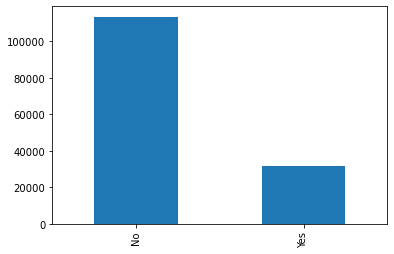

In [19]:
# Its now time to do some Exploratory Data Analysis

rain['RainTomorrow'].value_counts().plot(kind='bar')

<AxesSubplot:xlabel='Sunshine', ylabel='Rainfall'>

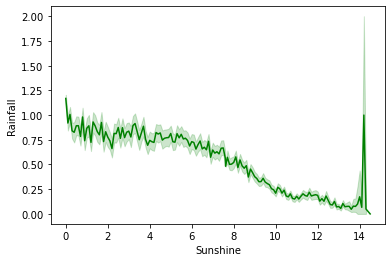

In [20]:
# Looks like the Target variable is imbalanced. It has more ‘No’ values. If data is imbalanced, 
# then it might decrease the performance of the model. As this data is released by the meteorological 
# department of Australia, it doesn’t make any sense when we try to balance the target variable, 
# because the truthfulness of data might decrease. So, let me keep it as it is.

# Bi-Variate Analysis:
# Sunshine versus Rainfall 

sns.lineplot(data = rain, x='Sunshine', y='Rainfall', color = 'green')

<AxesSubplot:xlabel='Sunshine', ylabel='Evaporation'>

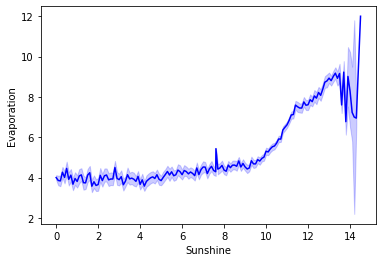

In [21]:
# Sunshine verus Rainfall

sns.lineplot(data = rain, x='Sunshine', y='Evaporation', color = 'blue')

In [22]:
# Encoding of Categorical Variables -- Feature Encoding. 

# Most Machine Learning Algorithms like Logistic Regression, Support Vector Machines, 
# K Nearest Neighbours, etc. can’t handle categorical data. Hence, these categorical data need 
# to converted to numerical data for modeling, which is called  Feature Encoding.

# Using the replace() function to encode categorical data into numerical

# This function takes feature name as a parameter  and returns mapping dictionary to replace(or map) 
# categorical data with numerical data.
def encode_data(feature_name):

    ''' 

    This function takes feature name as a parameter and returns mapping dictionary to replace(or map) categorical data with numerical data.

    '''

    mapping_dict = {}

    unique_values = list(rain[feature_name].unique())

    for idx in range(len(unique_values)):

        mapping_dict[unique_values[idx]] = idx

    return mapping_dict




rain['RainToday'].replace({'No':0, 'Yes': 1}, inplace = True)

rain['RainTomorrow'].replace({'No':0, 'Yes': 1}, inplace = True)

rain['WindGustDir'].replace(encode_data('WindGustDir'),inplace = True)

rain['WindDir9am'].replace(encode_data('WindDir9am'),inplace = True)

rain['WindDir3pm'].replace(encode_data('WindDir3pm'),inplace = True)

rain['Location'].replace(encode_data('Location'), inplace = True)

rain.head()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,year,month,day
0,0,13.4,22.9,0.6,5.318667,7.611178,0,44.0,0,0,...,1007.1,8.000000,4.50993,16.9,21.8,0,0,2008,12,1
1,0,7.4,25.1,0.0,5.318667,7.611178,1,44.0,1,1,...,1007.8,4.447461,4.50993,17.2,24.3,0,0,2008,12,2
2,0,12.9,25.7,0.0,5.318667,7.611178,2,46.0,0,1,...,1008.7,4.447461,2.00000,21.0,23.2,0,0,2008,12,3
3,0,9.2,28.0,0.0,5.318667,7.611178,3,24.0,2,2,...,1012.8,4.447461,4.50993,18.1,26.5,0,0,2008,12,4
4,0,17.5,32.3,1.0,5.318667,7.611178,0,41.0,3,3,...,1006.0,7.000000,8.00000,17.8,29.7,0,0,2008,12,5


<AxesSubplot:>

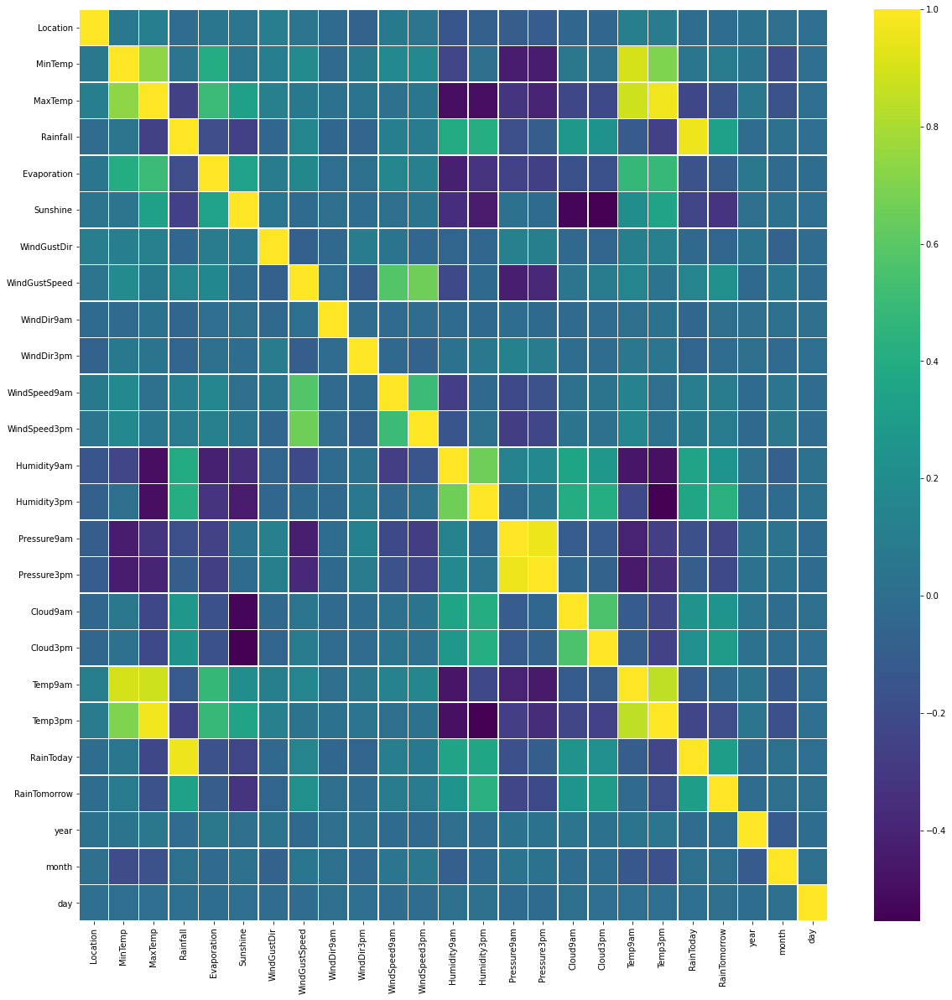

In [23]:
# Correlations 

plt.figure(figsize=(20,20))
sns.heatmap(rain.corr(), linewidths=0.5, annot=False, fmt=".2f", cmap = 'viridis')

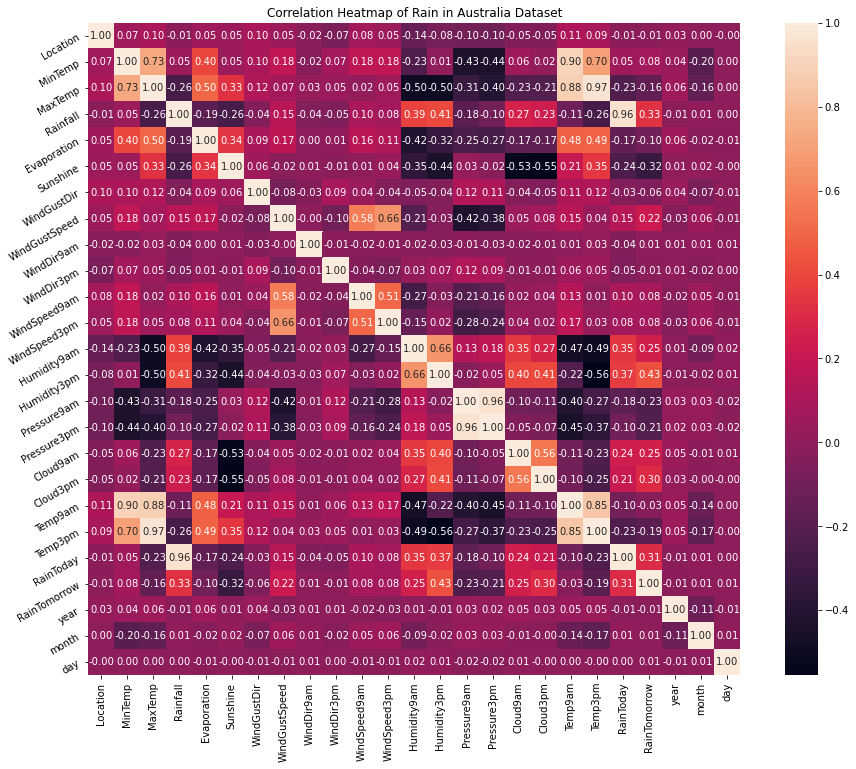

In [24]:
correlation = rain.corr()
plt.figure(figsize=(16,12))
plt.title('Correlation Heatmap of Rain in Australia Dataset')
ax = sns.heatmap(correlation, square=True, annot=True, fmt='.2f', linecolor='white')
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
ax.set_yticklabels(ax.get_yticklabels(), rotation=30)           
plt.show()

In [25]:
# MaxTemp,MinTemp,Temp9am,Temp3pm are highly correlated.

# Sunshine, Cloud9am, Cloud3am are also highly correlated.

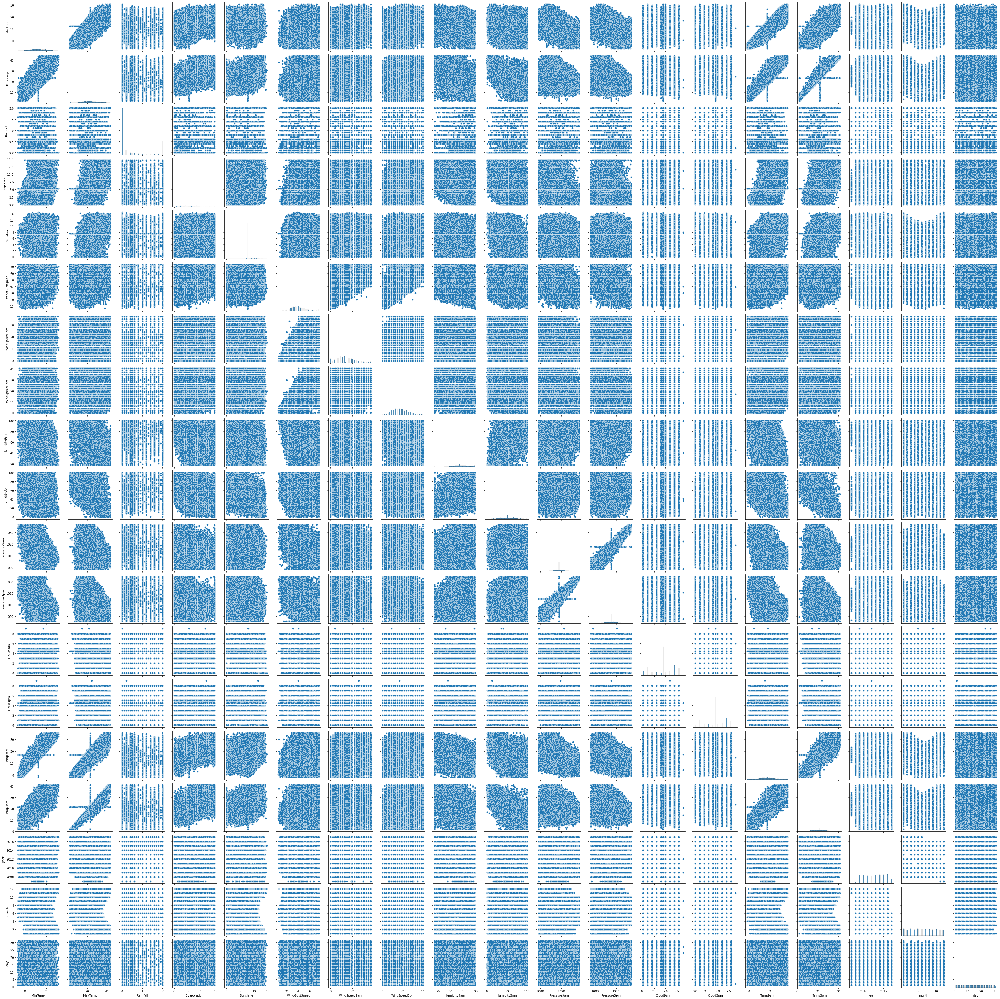

In [26]:
sns.pairplot(rain[numerical_features], kind = 'scatter', diag_kind = 'hist', palette = 'Rainbow')
plt.show()

In [27]:
# For feature importance and feature scaling, we need to split data into independent and dependent features 
X = rain.drop(['RainTomorrow'],axis=1)
y = rain['RainTomorrow']

In [28]:
#  Feature Importance:
 # Machine Learning Model performance depends on features that are used to train a model. 
 # Feature importance describes which features are relevant to build a model.
 # Feature Importance refers to the techniques that assign a score to input/label 
 # features based on how useful they are at predicting a target variable. 
 #Feature importance helps in Feature Selection.
 #We’ll be using ExtraTreesRegressor class for Feature Importance. 
 #This class implements a meta estimator that fits a number of randomized decision trees 
 #on various samples of the dataset and uses averaging to improve the predictive accuracy and control over-fitting.

In [30]:
from sklearn.ensemble import ExtraTreesRegressor
etr_model = ExtraTreesRegressor()
etr_model.fit(X,y)
etr_model.feature_importances_

array([0.03472264, 0.0300278 , 0.02868035, 0.04634784, 0.02340658,
       0.04152792, 0.03010142, 0.05658199, 0.03055613, 0.0316041 ,
       0.03092422, 0.03261128, 0.03704492, 0.20198341, 0.03663736,
       0.04949   , 0.02403904, 0.03620991, 0.02812757, 0.02850639,
       0.04700882, 0.03083069, 0.03041781, 0.03261183])

In [ ]:
feature_imp = pd.Series(etr_model.feature_importances_,index=X.columns)
feature_imp.nlargest(10).plot(kind='barh')

In [35]:
# Splitting Data into training and testing set
# train_test_split() is a method of model_selection class used to split data into training and testing sets.

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size = 0.35, random_state = 0)

In [36]:
# Length of Training and Testing set
print("Length of Training Data: {}".format(len(X_train)))
print("Length of Testing Data: {}".format(len(X_test)))

Length of Training Data: 94549
Length of Testing Data: 50911


In [37]:
# Feature Scaling

# Feature Scaling is a technique used to scale, normalize, standardize data in range(0,1). 
# When each column of a dataset has distinct values, then it helps to scale data of each column to a common level. 
# StandardScaler is a class used to implement feature scaling.

from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)

In [38]:
X_test = scaler.transform(X_test)

In [ ]:
### -------------------- MODEL BUILDING --------------------------###

In [ ]:
# Logistic Regression algorithm to build a predictive model to predict whether or not it will rain tomorrow in Australia.
# Logistic Regression: It is a statistic-based algorithm used in classification problems. 
# It allows us to predict the probability of an input belongs to a certain category.

In [39]:
from sklearn.linear_model import LogisticRegression
classifier_logreg = LogisticRegression(solver='liblinear', random_state=0)  # WTF is "random state"?
model = classifier_logreg.fit(X_train, y_train)
model

LogisticRegression(random_state=0, solver='liblinear')

In [41]:
# Model Testing

y_pred = model.predict(X_test)


In [42]:
# # Evaluating Model Performance:
# Accuracy_score() is a method used to calculate the accuracy of a model prediction on unseen data.

from sklearn.metrics import accuracy_score
print("Accuracy Score: {}".format(accuracy_score(y_test,y_pred)))

Accuracy Score: 0.8433737306279586


In [43]:
# Checking for Underfitting and Overfitting:

print("Train Data Score: {}".format(classifier_logreg.score(X_train, y_train)))
print("Test Data Score: {}".format(classifier_logreg.score(X_test, y_test)))

Train Data Score: 0.8444087192884113
Test Data Score: 0.8433737306279586


In [ ]:
# The accuracy Score of training and testing data is comparable and almost equal. 
# So, there is no question of underfitting and overfitting. And the model is generalizing well for new unseen data.

In [44]:
# Confusion Matrix:
# A Confusion Matrix is used to summarize the performance of the classification problem. 
# It gives a holistic view of how well the model is performing.


from sklearn.metrics import confusion_matrix
print(confusion_matrix(y_test,y_pred))

[[37638  2074]
 [ 5900  5299]]


In [47]:
from sklearn.metrics import classification_report

print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.86      0.95      0.90     39712
           1       0.72      0.47      0.57     11199

    accuracy                           0.84     50911
   macro avg       0.79      0.71      0.74     50911
weighted avg       0.83      0.84      0.83     50911



AttributeError: 'LogisticRegression' object has no attribute 'summary'